# Dogs Skin Disease Detection

- Aryan Dutt
- Prince Raj
- Maria Camila Villamizar 

## Preprocessing  

In [2]:
import os
import numpy as np
import cv2
from sklearn.model_selection import train_test_split

Declaring the path, the default image size for all images and the lists to store images and labels 

In [4]:
#Path to the main dataset folder
DATASET_PATH = "./Dataset"

#Image dimensions to resize
IMG_HEIGHT, IMG_WIDTH = 224, 224

#Lists to store images and labels
images = []
labels = []

Resizing, and saving images and labels

In [6]:
for label_folder in os.listdir(DATASET_PATH):
    
    label_path = os.path.join(DATASET_PATH, label_folder) #Label will be the name of the folder 
    
    if os.path.isdir(label_path):
        #For each image
        for image_file in os.listdir(label_path):
            
            #Build the full path to the image
            image_path = os.path.join(label_path, image_file)
            
            #Read and resize the image
            image = cv2.imread(image_path)                          
            if image is not None:                                   
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, (IMG_WIDTH, IMG_HEIGHT))  
                images.append(image)                                
                labels.append(label_folder)                         

Normalizing pixel values and converting lists to numpy arrays

In [8]:
#Converting lists to NumPy arrays
images = np.array(images, dtype="float32")
labels = np.array(labels)

#Normalizing pixel values (scale to [0, 1])
images = images / 255.0

Splitting into training and test sets

In [10]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.2, random_state=42)

print("Training set shape:", X_train.shape, y_train.shape)
print("Testing set shape:", X_test.shape, y_test.shape)

Training set shape: (98, 224, 224, 3) (98,)
Testing set shape: (25, 224, 224, 3) (25,)


Checking training and test sets

In [12]:
from collections import Counter

In [13]:
print(f"Number of images in the training set: {len(X_train)}")
print(f"Number of images in the testing set: {len(X_test)}")

#Checking the distribution of labels in both sets
print("Label distribution in the training set:")
print(Counter(y_train))

print("Label distribution in the testing set:")
print(Counter(y_test))


Number of images in the training set: 98
Number of images in the testing set: 25
Label distribution in the training set:
Counter({'Parasites': 25, 'Infections': 20, 'Allergies': 20, 'Autoimmune': 18, 'Healthy': 15})
Label distribution in the testing set:
Counter({'Allergies': 6, 'Autoimmune': 6, 'Infections': 5, 'Healthy': 5, 'Parasites': 3})


### Saving Training and test sets in a different directory

In [15]:
import shutil

In [16]:
#Paths where we will store the images 
output_dir = "./ModelData"
training_dir = os.path.join(output_dir, "Training")
testing_dir = os.path.join(output_dir, "Testing")

#Removing directories if they already exist
if os.path.exists(training_dir):
    shutil.rmtree(training_dir)  #Removing the training directory
if os.path.exists(testing_dir):
    shutil.rmtree(testing_dir)  #Removing the testing directory
    
#Creating the directories 
os.makedirs(training_dir, exist_ok=True)
os.makedirs(testing_dir, exist_ok=True)

In [17]:
# Moving training and testing data into their respective folders
for label in set(y_train):
    os.makedirs(os.path.join(training_dir, label), exist_ok=True)
    os.makedirs(os.path.join(testing_dir, label), exist_ok=True)

# Copying training images
for img, label in zip(X_train, y_train):
    img_path = os.path.join(training_dir, label, f"{hash(img.tobytes())}.jpg")
    img_bgr = cv2.cvtColor((img * 255).astype("uint8"), cv2.COLOR_RGB2BGR)  # Convert to BGR before saving
    cv2.imwrite(img_path, img_bgr)

# Copying testing images
for img, label in zip(X_test, y_test):
    img_path = os.path.join(testing_dir, label, f"{hash(img.tobytes())}.jpg")
    img_bgr = cv2.cvtColor((img * 255).astype("uint8"), cv2.COLOR_RGB2BGR)  # Convert to BGR before saving
    cv2.imwrite(img_path, img_bgr)


Previsualizing images

In [19]:
import matplotlib.pyplot as plt
from collections import defaultdict

In [20]:
# Function to preview images
def preview_images_per_class(folder_path, images_per_class=2):
    plt.figure(figsize=(10, 10))
    class_counts = defaultdict(int)
    total_images = 0
    
    for label_folder in os.listdir(folder_path):
        label_path = os.path.join(folder_path, label_folder)
        if os.path.isdir(label_path):
            for image_file in os.listdir(label_path):
                if image_file.lower().endswith((".png", ".jpg", ".jpeg")):  # Accept multiple formats
                    if class_counts[label_folder] < images_per_class:  # Limit per class
                        img_path = os.path.join(label_path, image_file)
                        img = cv2.imread(img_path)  # Load image
                        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for visualization
                        plt.subplot(len(os.listdir(folder_path)), images_per_class, total_images + 1)
                        plt.imshow(img)
                        plt.title(label_folder)
                        plt.axis('off')
                        class_counts[label_folder] += 1
                        total_images += 1
                    if class_counts[label_folder] >= images_per_class:
                        break
    plt.tight_layout()
    plt.show()

Training Set:


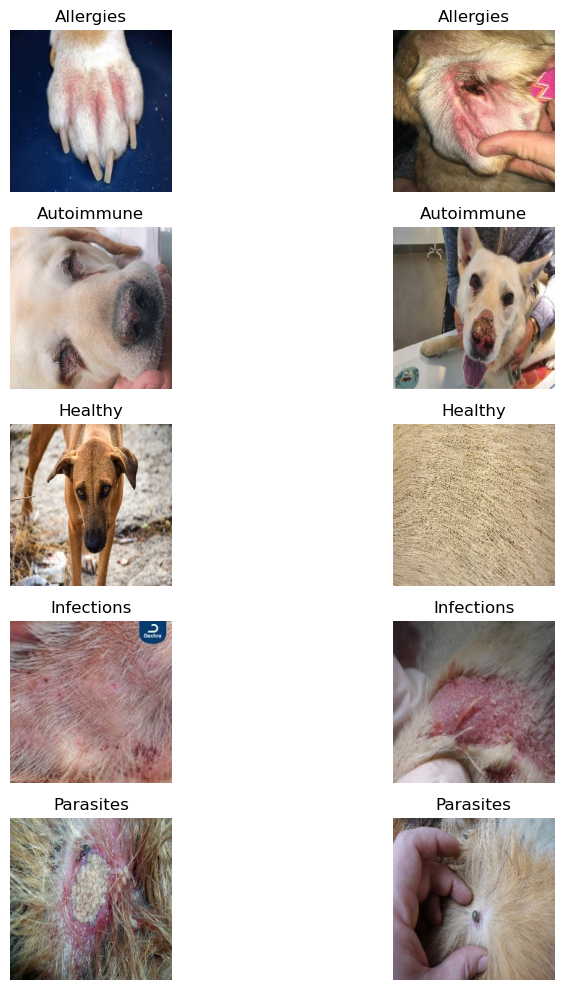

In [21]:
# Preview training set
print("Training Set:")
preview_images_per_class(training_dir, images_per_class=2)

Testing Set:


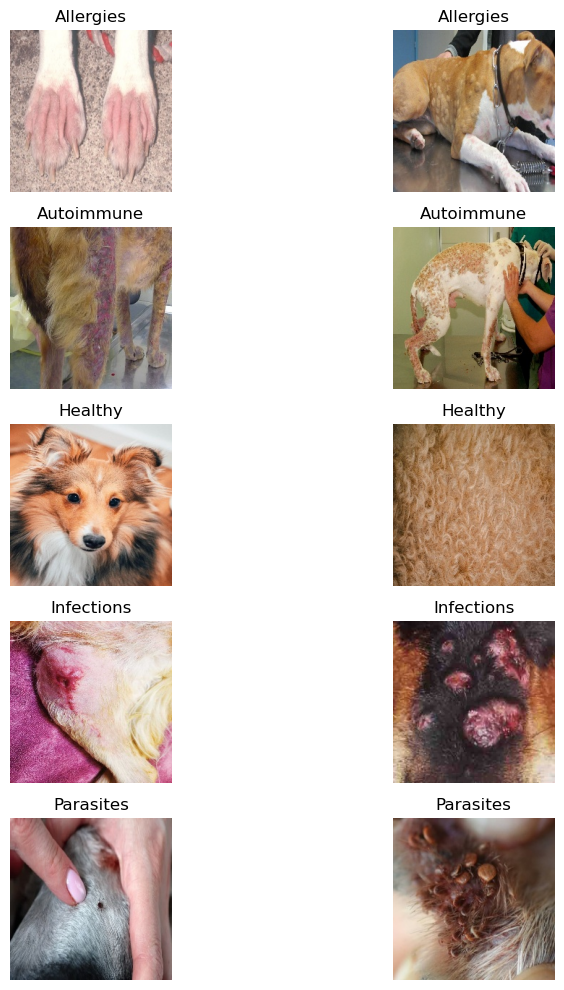

In [22]:
# Preview testing set
print("Testing Set:")
preview_images_per_class(testing_dir, images_per_class=2)

##  Data Augmentation for Training set

In [24]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [25]:
#Augmentation
augmentation = ImageDataGenerator(
    rotation_range=20,           
    width_shift_range=0.2,       
    height_shift_range=0.2,      
    shear_range=0.2,             
    zoom_range=0.2,              
    horizontal_flip=True,        
    fill_mode='nearest'          
)


In [26]:
# Applying the augmentation
for label_folder in os.listdir(training_dir):
    
    label_path = os.path.join(training_dir, label_folder)
    
    if os.path.isdir(label_path): 
        
        for image_file in os.listdir(label_path):
            
            if image_file.lower().endswith((".png", ".jpg", ".jpeg")): 
                img_path = os.path.join(label_path, image_file)
                
                #Converting BGR to RGB
                img = cv2.imread(img_path)
                if img is not None:  # Ensuring the image is valid
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  #Converting to RGB
                    
                    #Ensuring the pixel values are in the correct range
                    img = img.astype('float32') 
                    
                    img = img.reshape((1,) + img.shape)  # Reshape 
                    
                    #Saving augmented images
                    count = 0
                    for batch in augmentation.flow(img, batch_size=1, save_to_dir=label_path, save_prefix='aug', save_format='jpg'):
                        count += 1
                        if count >= 2:  #Number of augmented images per original image
                            break


Getting the training images and labels

In [28]:
import numpy as np

In [29]:
#Path to the training folder
training_dir = "./ModelData/Training"

# Lists to store images and labels
X_train = []
y_train = []

In [30]:
#Loading all images from the training folder
for label_folder in os.listdir(training_dir):
    label_path = os.path.join(training_dir, label_folder)
    if os.path.isdir(label_path): 
        for image_file in os.listdir(label_path):
            if image_file.lower().endswith((".png", ".jpg", ".jpeg")): 
                img_path = os.path.join(label_path, image_file)
                
                #Load image
                img = cv2.imread(img_path)
                if img is not None:                             # Ensure the image is valid
                    img = cv2.resize(img, (224, 224))           # Resize to 224x224
                    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
                    X_train.append(img)
                    y_train.append(label_folder)                # Using folder name as the label

In [31]:
#Converting to NumPy arrays
X_train = np.array(X_train).astype('float32')  # Convert to float32
y_train = np.array(y_train)

#Normalizing pixel values to [0, 1]
X_train /= 255.0

In [32]:
#Checking the shapes and types
print(f"X_train shape: {X_train.shape}")
print(f"y_train shape: {y_train.shape}")
print(f"y_train dtype: {y_train.dtype}")

X_train shape: (291, 224, 224, 3)
y_train shape: (291,)
y_train dtype: <U10


Converting labels to int format

In [34]:
from sklearn.preprocessing import LabelEncoder

In [35]:
#Converting string labels in the training set to integers
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)

#Applying the same transformation to the test set
y_test = label_encoder.transform(y_test)

#Verifying consistency
print("Mapping of classes to integers:")
for class_name, label in zip(label_encoder.classes_, range(len(label_encoder.classes_))):
    print(f"{class_name}: {label}")

#Checking transformed test labels
print(f"y_test dtype after transformation: {y_test.dtype}")  # Should be int
print(f"y_test values: {y_test[:10]}")  # Show a few test labels

Mapping of classes to integers:
Allergies: 0
Autoimmune: 1
Healthy: 2
Infections: 3
Parasites: 4
y_test dtype after transformation: int32
y_test values: [0 1 1 3 0 1 2 4 1 2]


In [36]:
import os

print("Training Set:")
for label_folder in os.listdir(training_dir):
    label_path = os.path.join(training_dir, label_folder)
    print(f"{label_folder}: {len(os.listdir(label_path))} images")

print("\nTesting Set:")
for label_folder in os.listdir(testing_dir):
    label_path = os.path.join(testing_dir, label_folder)
    print(f"{label_folder}: {len(os.listdir(label_path))} images")


Training Set:
Allergies: 60 images
Autoimmune: 54 images
Healthy: 45 images
Infections: 60 images
Parasites: 72 images

Testing Set:
Allergies: 6 images
Autoimmune: 6 images
Healthy: 5 images
Infections: 5 images
Parasites: 3 images


Training Set:
Class: Allergies (60 images)


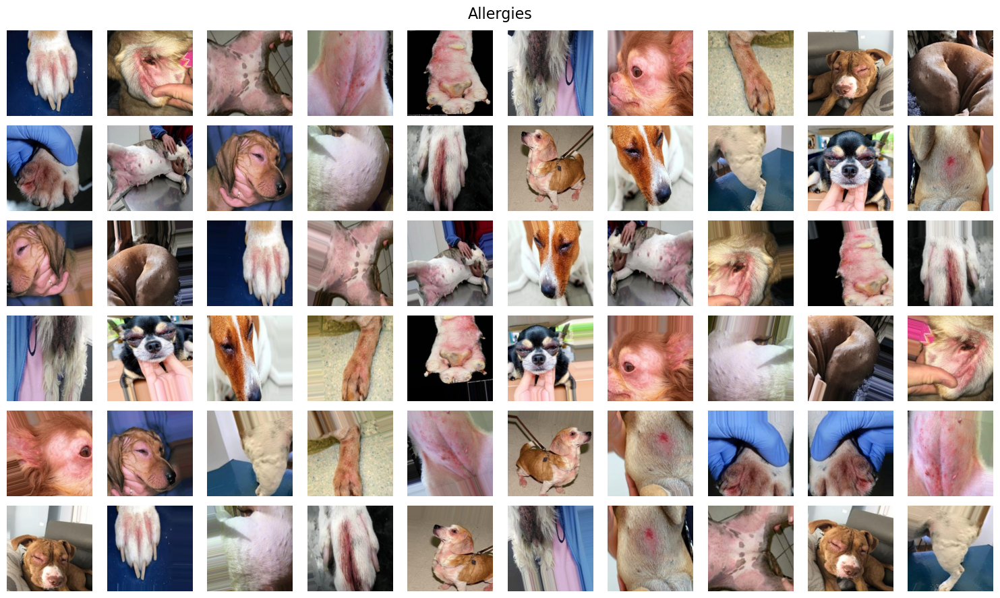

Class: Autoimmune (54 images)


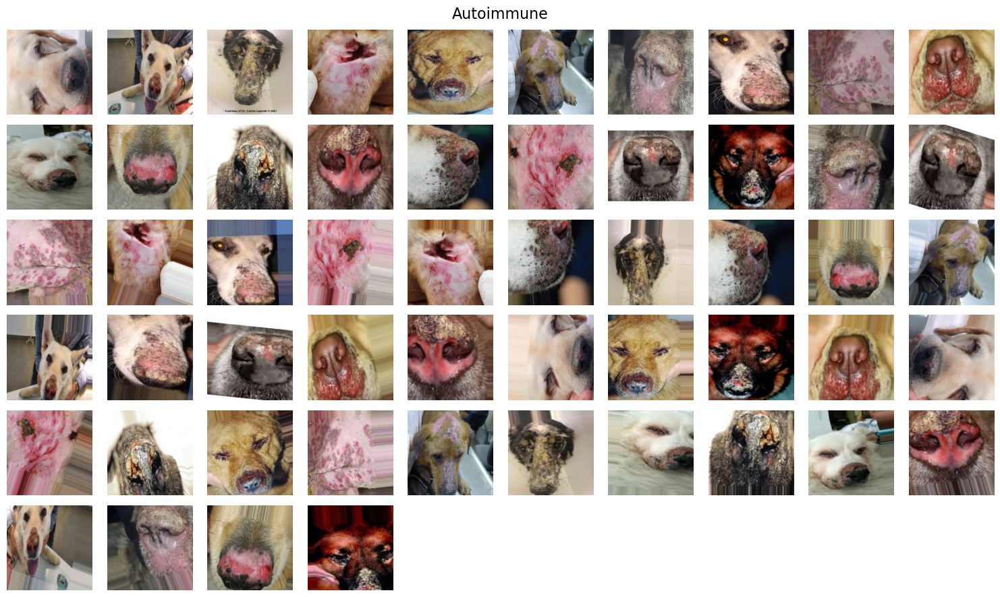

Class: Healthy (45 images)


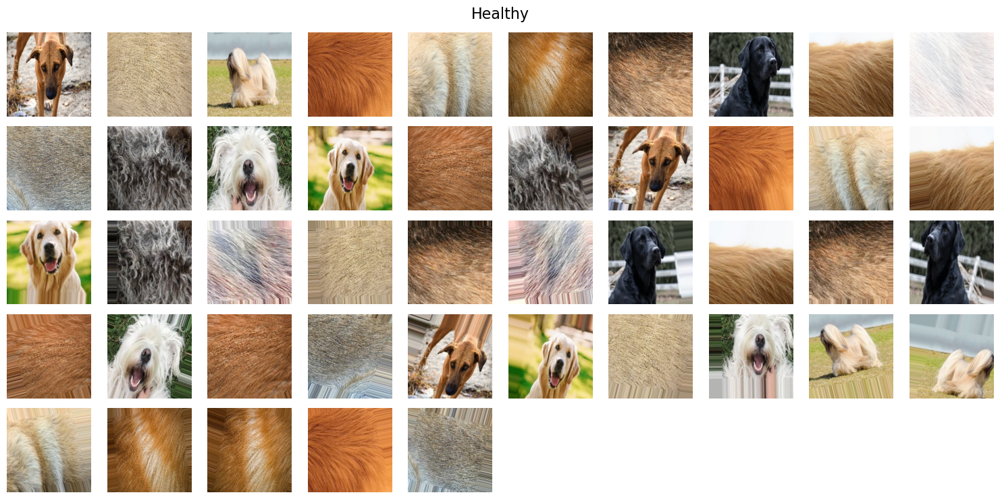

Class: Infections (60 images)


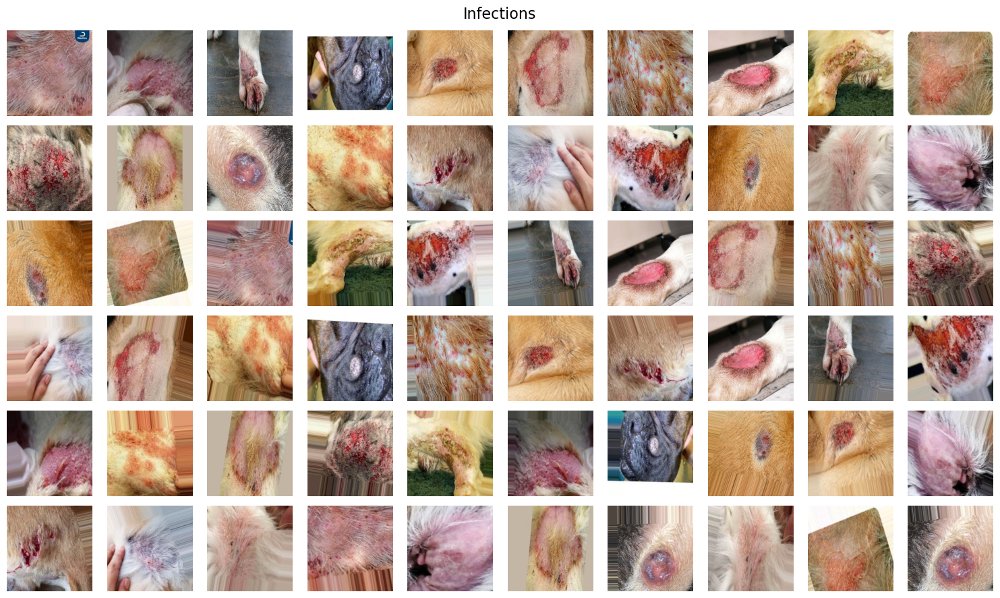

Class: Parasites (72 images)


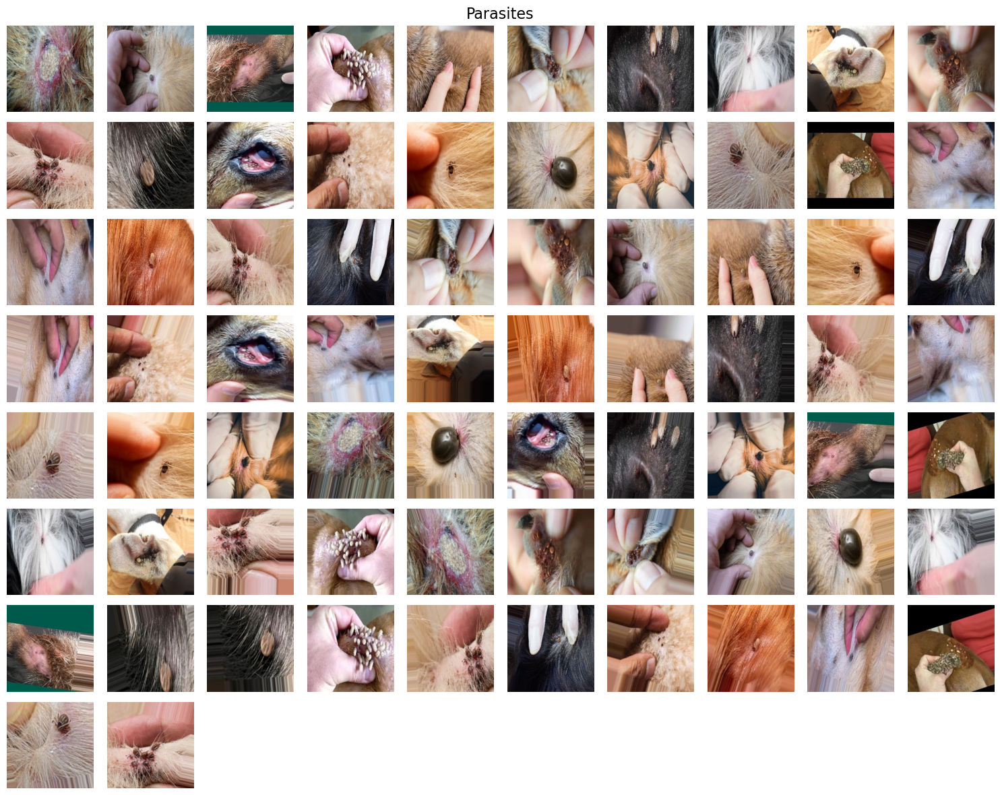

Testing Set:
Class: Allergies (6 images)


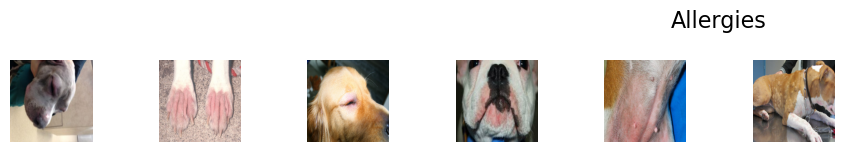

Class: Autoimmune (6 images)


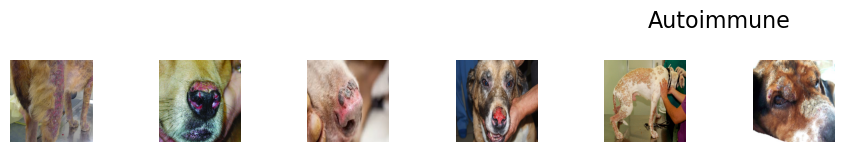

Class: Healthy (5 images)


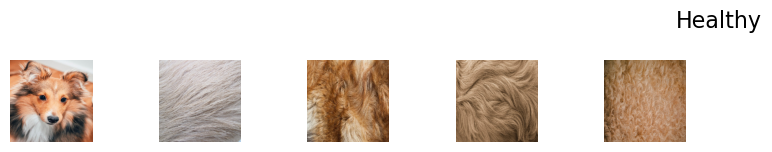

Class: Infections (5 images)


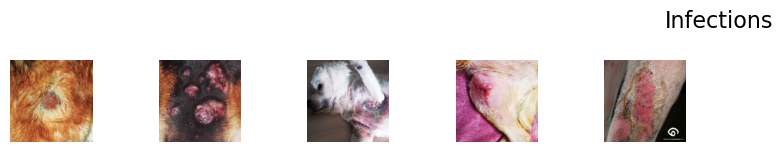

Class: Parasites (3 images)


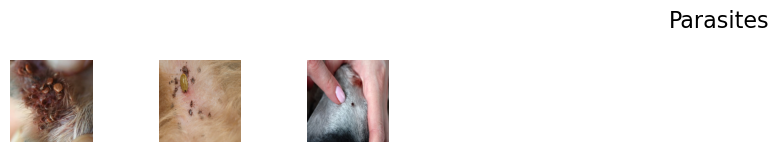

Training class distribution: Counter({4: 72, 0: 60, 3: 60, 1: 54, 2: 45})
Testing class distribution: Counter({0: 6, 1: 6, 3: 5, 2: 5, 4: 3})


In [37]:
import matplotlib.pyplot as plt
import numpy as np

def display_images_by_class_grid(images, labels, label_encoder, dataset_type="Training"):
    """
    Display all images in a grid grouped by class from the given dataset.

    Parameters:
    - images: Array of image data.
    - labels: Array of corresponding class labels.
    - label_encoder: LabelEncoder instance to decode class names.
    - dataset_type: String indicating the dataset type (e.g., "Training", "Testing").
    """
    class_labels = label_encoder.classes_  #Retrieve the class names
    num_classes = len(class_labels)
    
    print(f"{dataset_type} Set:")
    for class_idx, class_name in enumerate(class_labels):
        # Get images and labels for the current class
        class_images = images[np.where(labels == class_idx)]  #Filter images for the current class
        
        if len(class_images) == 0:
            print(f"No images found for class {class_name}")
            continue
        
        # Set up grid for displaying images
        num_images = len(class_images)
        grid_cols = 10  # Number of columns in the grid
        grid_rows = (num_images // grid_cols) + (1 if num_images % grid_cols != 0 else 0)  # Compute rows
        
        print(f"Class: {class_name} ({num_images} images)")
        plt.figure(figsize=(grid_cols * 1.5, grid_rows * 1.5))  # Adjust figure size
        
        for i, img in enumerate(class_images):
            plt.subplot(grid_rows, grid_cols, i + 1)
            plt.imshow(img)
            plt.axis("off")
            plt.title("")
        
        plt.suptitle(class_name, fontsize=16)
        plt.tight_layout()
        plt.show()

y_train = np.array(y_train)
y_test = np.array(y_test)

# Display images in the training set (grid)
display_images_by_class_grid(X_train, y_train, label_encoder, dataset_type="Training")

# Display images in the testing set (grid)
display_images_by_class_grid(X_test, y_test, label_encoder, dataset_type="Testing")

from collections import Counter
print("Training class distribution:", Counter(y_train))
print("Testing class distribution:", Counter(y_test))


## Training the model using K-fold cross-validation

In [39]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.metrics import AUC
import numpy as np
from sklearn.model_selection import KFold
import shutil
from tensorflow.keras.utils import to_categorical

Initializations

In [41]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.metrics import AUC
from sklearn.utils import resample
import numpy as np
import shutil
from tensorflow.keras.utils import to_categorical

# Convert labels to one-hot encoding
y_train_one_hot = to_categorical(y_train, num_classes=len(set(y_train)))
y_test_one_hot = to_categorical(y_test, num_classes=len(set(y_train)))

# Load MobileNetV2 base model
base_model = MobileNetV2(input_shape=(224, 224, 3),
                         include_top=False,  # Exclude the top layer
                         weights='imagenet')

# Freeze base layers initially
base_model.trainable = False

# Build the complete model with custom layers
model = models.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),  # Dimensionality reduction
    layers.Dense(256, activation='relu'),  # Intermediate dense layer
    layers.Dropout(0.5),  # Dropout to prevent overfitting
    layers.Dense(len(set(y_train)), activation='softmax')  # Output layer for classification
])

# Compile the model
model.compile(optimizer=Adam(learning_rate=0.001),
              loss="categorical_crossentropy",  # Use categorical crossentropy
              metrics=["accuracy", AUC(name="auc")])  # Include AUC as a metric

# Early Stopping to avoid overfitting
early_stopping = EarlyStopping(monitor='val_auc', patience=5, mode='max', restore_best_weights=True)

# Variables to store results
accuracies = []
auc_scores = []
best_val_auc = float("-inf")
best_model_path = "best_model_bootstrap.keras"

# Bootstrapping
n_iterations = 5  # Number of bootstrap iterations
for iteration in range(n_iterations):
    print(f"\nBootstrap Iteration {iteration + 1}...")

    # Bootstrap resampling
    X_train_bootstrap, y_train_bootstrap = resample(X_train, y_train_one_hot, random_state=iteration)
    X_val_bootstrap, y_val_bootstrap = X_train, y_train_one_hot  # Out-of-bag samples act as validation set

    # Save the best model for this bootstrap iteration
    checkpoint = ModelCheckpoint(f"best_model_iteration_{iteration + 1}.keras", save_best_only=True, monitor="val_auc", mode="max")

    # Train the model
    history = model.fit(
        X_train_bootstrap, y_train_bootstrap,
        validation_data=(X_val_bootstrap, y_val_bootstrap),
        epochs=20,
        batch_size=32,
        callbacks=[early_stopping, checkpoint],
        verbose=1
    )

    # Evaluate the model on the validation set
    eval_result = model.evaluate(X_val_bootstrap, y_val_bootstrap, verbose=0)
    accuracies.append(eval_result[1])  # Save accuracy for this iteration
    auc_scores.append(eval_result[2])  # Save AUC for this iteration

    # Update the global best model
    if max(history.history["val_auc"]) > best_val_auc:
        best_val_auc = max(history.history["val_auc"])
        shutil.copy(f"best_model_iteration_{iteration + 1}.keras", best_model_path)

    print(f"Iteration {iteration + 1} - Accuracy: {eval_result[1]}, Val AUC: {max(history.history['val_auc'])}")

print(f"\nBootstrap Accuracy: {np.mean(accuracies)} ± {np.std(accuracies)}")
print(f"Bootstrap AUC: {np.mean(auc_scores)} ± {np.std(auc_scores)}")
print(f"Best model saved as '{best_model_path}'.")

# Fine-Tuning: Unfreeze the base layers of the model
print("\nStarting Fine-Tuning...")
base_model.trainable = True  # Make the base layers trainable

# Recompile the model with a lower learning rate
model.compile(optimizer=Adam(learning_rate=1e-5),  # Fine-tuning with a smaller learning rate
              loss="categorical_crossentropy",  # Use categorical crossentropy
              metrics=["accuracy", AUC(name="auc")])

# Fine-tuning on the entire training dataset
fine_tuning_checkpoint = ModelCheckpoint(f"{best_model_path.split('.')[0]}_tunned.keras", save_best_only=True, monitor="val_auc", mode="max")
fine_tune_history = model.fit(
    X_train, y_train_one_hot,  # Use the full training data
    validation_data=(X_test, y_test_one_hot),  # Validate on the test set
    epochs=10,
    batch_size=32,
    callbacks=[
        EarlyStopping(monitor="val_auc", patience=3, mode="max", restore_best_weights=True),
        fine_tuning_checkpoint
    ],
    verbose=1
)

print(f"\nFine-Tuning completed. Fine-tuned model saved as '{best_model_path.split('.')[0]}_tunned.keras'.")



Bootstrap Iteration 1...
Epoch 1/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.3665 - auc: 0.6596 - loss: 1.7879 - val_accuracy: 0.8179 - val_auc: 0.9704 - val_loss: 0.5233
Epoch 2/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 742ms/step - accuracy: 0.8111 - auc: 0.9660 - loss: 0.5201 - val_accuracy: 0.9003 - val_auc: 0.9866 - val_loss: 0.3277
Epoch 3/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 7s 681ms/step - accuracy: 0.8782 - auc: 0.9843 - loss: 0.3487 - val_accuracy: 0.9038 - val_auc: 0.9911 - val_loss: 0.2761
Epoch 4/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 668ms/step - accuracy: 0.9442 - auc: 0.9957 - loss: 0.1977 - val_accuracy: 0.9244 - val_auc: 0.9968 - val_loss: 0.1791
Epoch 5/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 664ms/step - accuracy: 0.9554 - auc: 0.9991 - loss: 0.1210 - val_accuracy: 0.9485 - val_auc: 0.9977 - val_loss: 0.1543
Epoch 6/20
10/10 ━━━━━━━━━━━━━━━━━━━━ 6s 676ms/step - accuracy: 0.9768 - auc: 0.9994 - loss: 0.1010 - val_accuracy: 0.9416 - val_auc: 0.9983 - val_loss: 0.1324
Epoch 7/20
10/10

## Evaluating the model

In [43]:
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras.models import load_model
import seaborn as sns

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Classification Report:
              precision    recall  f1-score   support

           0       0.71      0.83      0.77         6
           1       0.62      0.83      0.71         6
           2       1.00      0.60      0.75         5
           3       1.00      0.80      0.89         5
           4       1.00      1.00      1.00         3

    accuracy                           0.80        25
   macro avg       0.87      0.81      0.82        25
weighted avg       0.84      0.80      0.80        25



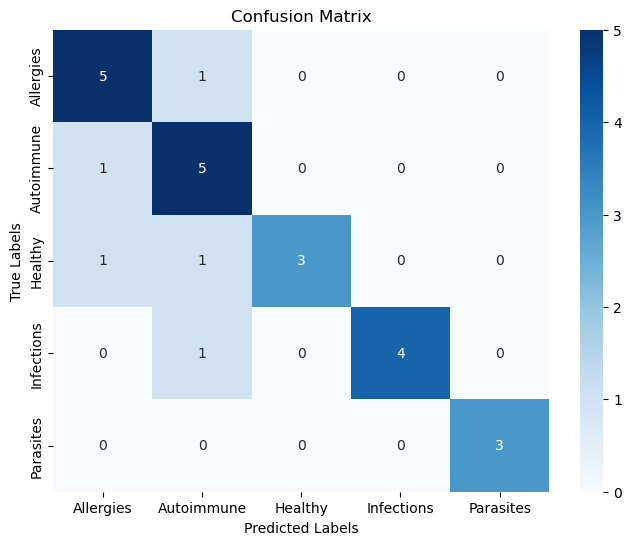

In [50]:
#Loading the best model
model = load_model("best_model_bootstrap_tunned.keras")

#Predicting on the test set
y_pred = model.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

#Classification report
print("Classification Report:")
print(classification_report(y_test, y_pred_classes))

#Generating confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_classes)

plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap="Blues", xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.title("Confusion Matrix")
plt.show()

AUC Score: 0.9206666666666667


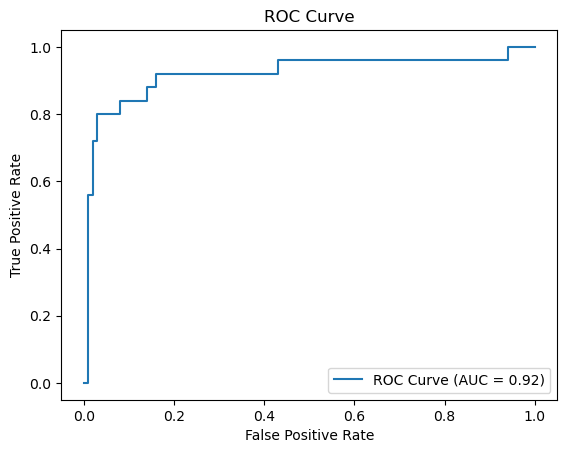

In [52]:
# ROC and AUC
y_test_binary = label_binarize(y_test, classes=np.unique(y_test)) 
auc_score = roc_auc_score(y_test_binary, y_pred, multi_class="ovr")
print("AUC Score:", auc_score)

# Plot ROC Curve
fpr, tpr, _ = roc_curve(y_test_binary.ravel(), y_pred.ravel())
plt.plot(fpr, tpr, label=f"ROC Curve (AUC = {auc_score:.2f})")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend()
plt.show()

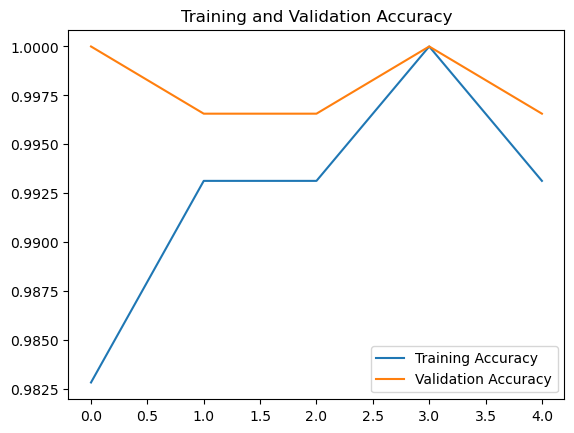

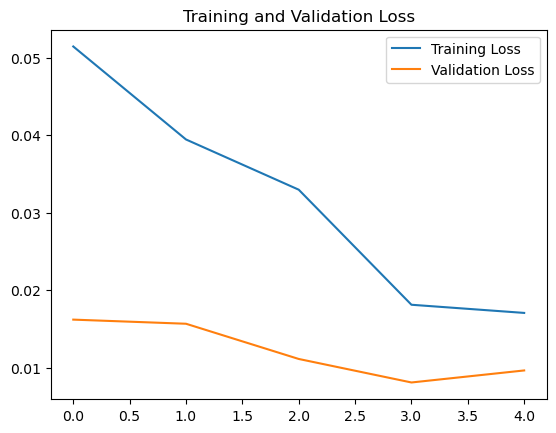

In [54]:
# Training and validation accuracy/loss curves
plt.figure()
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title("Training and Validation Accuracy")
plt.legend()
plt.show()

plt.figure()
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title("Training and Validation Loss")
plt.legend()
plt.show()